<a href="https://colab.research.google.com/github/Champei/Chaitanya/blob/main/task2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

# 1. INSTALL DEPENDENCIES

!pip install torch torchaudio torchvision transformers tqdm matplotlib


In [2]:

# 2. MOUNT GOOGLE DRIVE & VERIFY DATA

from google.colab import drive
drive.mount('/content/drive')
import os

BASE_PATH = '/content/drive/MyDrive/Audios'

print("Subfolders (categories):", os.listdir(BASE_PATH))


Mounted at /content/drive
Subfolders (categories): ['HORN', 'INSTRUMENT', 'FOREST']


In [3]:

# 3. IMPORTS & DATASET CLASS

import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchaudio, random, matplotlib.pyplot as plt
from tqdm import tqdm
from IPython.display import Audio, display

class TrainAudioSpectrogramDataset(Dataset):
    """Loads .wav files, converts to log-mel spectrograms, returns tensor + one-hot label."""
    def __init__(self, root_dir, categories, max_frames=512, fraction=1.0):
        self.root_dir, self.categories, self.max_frames = root_dir, categories, max_frames
        self.file_list = []
        self.class_to_idx = {cat: i for i, cat in enumerate(categories)}

        for cat in categories:
            path = os.path.join(root_dir, cat)
            files = [os.path.join(path, f) for f in os.listdir(path) if f.endswith('.wav')]
            n = int(len(files) * fraction)
            for f in random.sample(files, n):
                self.file_list.append((f, self.class_to_idx[cat]))

    def __len__(self): return len(self.file_list)

    def __getitem__(self, idx):
        path, label = self.file_list[idx]
        wav, sr = torchaudio.load(path)
        if wav.size(0) > 1: wav = wav.mean(0, keepdim=True)
        mel = torchaudio.transforms.MelSpectrogram(sr, n_fft=1024, hop_length=256, n_mels=128)(wav)
        logmel = torch.log1p(mel)
        _, _, n_frames = logmel.shape
        logmel = F.pad(logmel, (0, max(0, 512 - n_frames)))[:, :, :512]
        y = F.one_hot(torch.tensor(label), num_classes=len(self.categories)).float()
        return logmel, y


In [13]:

# 4. MODELS

class CGAN_Generator(nn.Module):
    def __init__(self, latent_dim, num_classes):
        super().__init__()
        self.latent_dim, self.num_classes = latent_dim, num_classes
        self.fc = nn.Linear(latent_dim + num_classes, 256 * 8 * 32)
        self.net = nn.Sequential(
            nn.ConvTranspose2d(256,128,4,2,1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.ConvTranspose2d(128,64,4,2,1), nn.BatchNorm2d(64), nn.ReLU(),
            nn.ConvTranspose2d(64,32,4,2,1), nn.BatchNorm2d(32), nn.ReLU(),
            nn.ConvTranspose2d(32,1,4,2,1), nn.ReLU()
        )
    def forward(self,z,y):
        h=torch.cat([z,y],1)
        h=self.fc(h).view(-1,256,8,32)
        return self.net(h)

class CGAN_Generator(nn.Module):
    """ The Forger/Artist """
    def __init__(self, latent_dim, num_categories, spec_shape=(128, 512)):
        super().__init__()
        self.latent_dim = latent_dim
        self.num_categories = num_categories   # ✅ <-- Make sure this line exists
        self.spec_shape = spec_shape

        # Upsampling architecture
        self.fc = nn.Linear(latent_dim + num_categories, 256 * 8 * 32)
        self.unflatten_shape = (256, 8, 32) # (channels, H, W)

        self.net = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1), # -> 16x64
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1), # -> 32x128
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1), # -> 64x256
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1), # -> 128x512
            nn.ReLU()
        )

    def forward(self, z, y):
        # Concatenate noise vector (z) and label (y)
        h = torch.cat([z, y], dim=1)
        h = self.fc(h)
        h = h.view(-1, *self.unflatten_shape)
        fake_spec = self.net(h)
        return fake_spec



In [27]:
# 5. UTILITIES FOR AUDIO GENERATION & PLAYBACK

def generate_audio_gan(generator, category_idx, num_samples, device, sample_rate=22050):
    generator.eval()
    num_categories = generator.num_categories
    latent_dim = generator.latent_dim

    # Prepare label and noise
    y = F.one_hot(torch.tensor([category_idx]), num_classes=num_categories).float().to(device)
    z = torch.randn(num_samples, latent_dim, device=device)

    with torch.no_grad():
        log_spec_gen = generator(z, y)

    # Convert log-mel spectrogram back to linear
    spec_gen = torch.expm1(log_spec_gen).squeeze(1)  # (B, 128, 512)

    # --- FIX: Mel -> Linear using batch matrix multiply ---
    mel_scale = torchaudio.transforms.MelScale(
        n_mels=128, n_stft=1024//2 + 1, sample_rate=sample_rate
    ).to(device)

    mel_weights = mel_scale.fb.to(device)            # (128, 513)
    mel_weights_pinv = torch.pinverse(mel_weights)   # (513, 128)

    # batch matrix multiply: (B, 128, 512) -> (B, 513, 512)
    spec_linear = torch.einsum('ij,bjk->bik', mel_weights_pinv, spec_gen)

    # Griffin-Lim to get waveform
    griffin = torchaudio.transforms.GriffinLim(
        n_fft=1024, hop_length=256, win_length=1024, n_iter=32
    ).to(device)

    waveform = griffin(spec_linear)

    return waveform.cpu()


def play_and_save(wav, sr, name):
    import torchaudio
    torchaudio.save(name, wav.squeeze(0), sr)
    print("Saved:", name)
    display(Audio(wav.numpy().squeeze(), rate=sr))


In [32]:
# 6. TRAINING FUNCTION

def train_gan(generator, discriminator, dataloader, device, categories, epochs, lr, latent_dim):
    """
    Trains a Conditional GAN on log-mel spectrograms.
    Saves spectrogram plots for each category every epoch.
    Waveform reconstruction is skipped to avoid Griffin-Lim / mel inversion errors.
    """

    # Optimizers
    optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    # Loss function
    criterion = nn.BCEWithLogitsLoss()

    # Create output directories
    os.makedirs("gan_spectrogram_plots", exist_ok=True)

    for epoch in range(1, epochs + 1):
        loop = tqdm(dataloader, desc=f"Epoch {epoch}/{epochs}", leave=True)
        for real_specs, labels in loop:
            real_specs = real_specs.to(device)
            labels = labels.to(device)
            batch_size = real_specs.size(0)

            # Labels for BCE loss
            real_labels_tensor = torch.ones(batch_size, 1, device=device)
            fake_labels_tensor = torch.zeros(batch_size, 1, device=device)

            # ---------------------
            #  Train Discriminator
            # ---------------------
            optimizer_D.zero_grad()
            real_output = discriminator(real_specs, labels)
            loss_D_real = criterion(real_output, real_labels_tensor)

            z = torch.randn(batch_size, latent_dim, device=device)
            fake_specs = generator(z, labels)

            fake_output = discriminator(fake_specs.detach(), labels)
            loss_D_fake = criterion(fake_output, fake_labels_tensor)

            loss_D = loss_D_real + loss_D_fake
            loss_D.backward()
            optimizer_D.step()

            # -----------------
            #  Train Generator
            # -----------------
            optimizer_G.zero_grad()
            output = discriminator(fake_specs, labels)
            loss_G = criterion(output, real_labels_tensor)

            loss_G.backward()
            optimizer_G.step()

            loop.set_postfix(loss_D=loss_D.item(), loss_G=loss_G.item())

        # --- End of Epoch: Generate and save spectrogram plots ---
        print(f"\n--- Generating Spectrograms for Epoch {epoch} ---")
        generator.eval()

        fig, axes = plt.subplots(1, len(categories), figsize=(4 * len(categories), 4))
        if len(categories) == 1: axes = [axes]

        for cat_idx, cat_name in enumerate(categories):
            y_cond = F.one_hot(torch.tensor([cat_idx]), num_classes=generator.num_categories).float().to(device)
            z_sample = torch.randn(1, generator.latent_dim).to(device)
            with torch.no_grad():
                spec_gen_log = generator(z_sample, y_cond)

            axes[cat_idx].imshow(spec_gen_log.squeeze().cpu().numpy(), aspect='auto', origin='lower', cmap='viridis')
            axes[cat_idx].set_title(f'{cat_name} (Epoch {epoch})')
            axes[cat_idx].axis('off')

        plt.tight_layout()
        plt.savefig(f'gan_spectrogram_plots/epoch_{epoch:03d}.png')
        plt.show()
        plt.close(fig)

        generator.train()  # back to training mode
        print(f"--- End of Epoch {epoch} ---\n")



In [16]:
!apt install ffmpeg -y


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.


In [24]:
import os

base_dir = '/content/drive/MyDrive/Audios'

for root, dirs, files in os.walk(base_dir):
    for f in files:
        if f.lower().endswith('.mp3'):
            mp3_path = os.path.join(root, f)
            wav_path = os.path.splitext(mp3_path)[0] + '.wav'

            # Only convert if WAV doesn't exist yet
            if not os.path.exists(wav_path):
                print(f"Converting: {mp3_path}")
                !ffmpeg -y -i "{mp3_path}" -ar 22050 -ac 1 "{wav_path}"


In [25]:
for cat in os.listdir(base_dir):
    cat_path = os.path.join(base_dir, cat)
    if os.path.isdir(cat_path):
        wavs = [f for f in os.listdir(cat_path) if f.endswith('.wav')]
        print(f"{cat}: {len(wavs)} wav files")


HORN: 5 wav files
INSTRUMENT: 5 wav files
FOREST: 5 wav files


Categories: ['FOREST', 'HORN', 'INSTRUMENT']


Epoch 1/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 1 ---


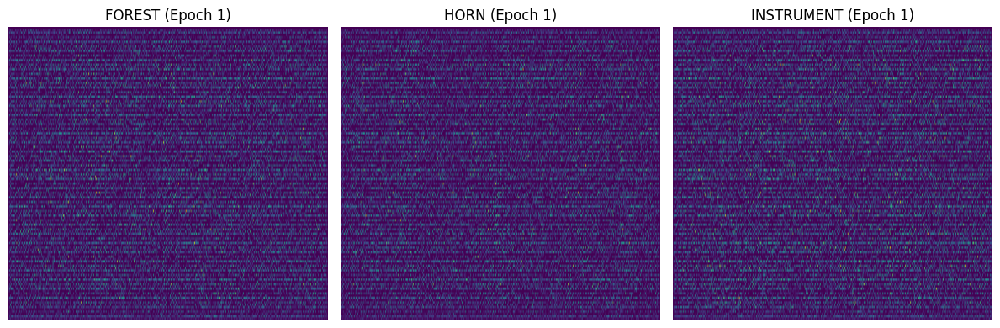

--- End of Epoch 1 ---



Epoch 2/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 2 ---


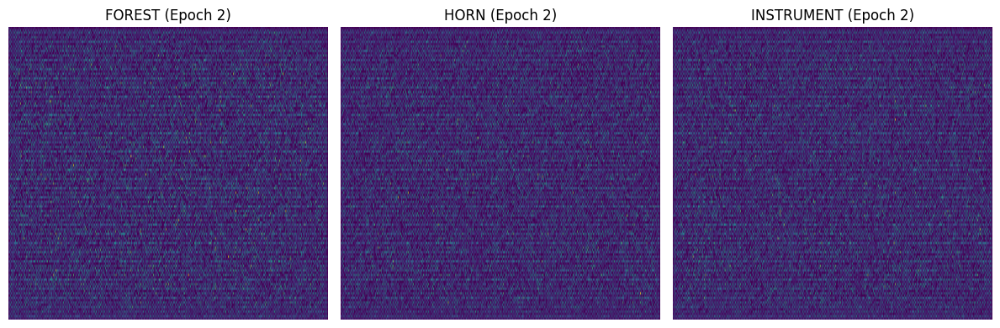

--- End of Epoch 2 ---



Epoch 3/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 3 ---


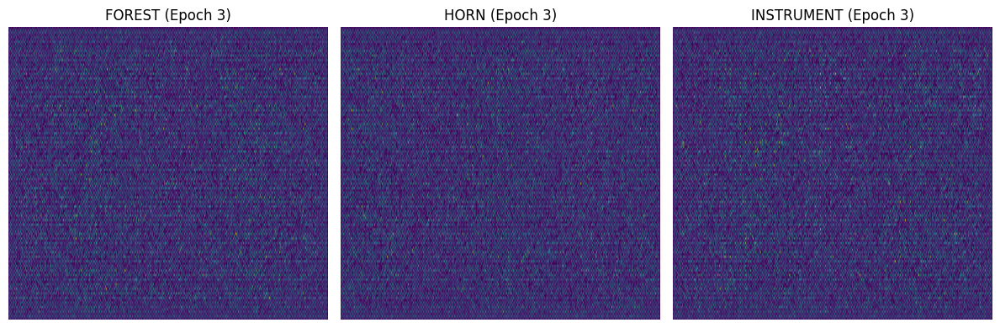

--- End of Epoch 3 ---



Epoch 4/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 4 ---


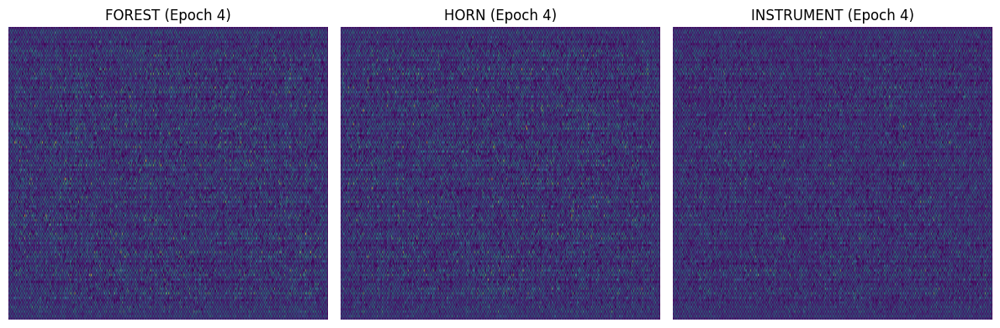

--- End of Epoch 4 ---



Epoch 5/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 5 ---


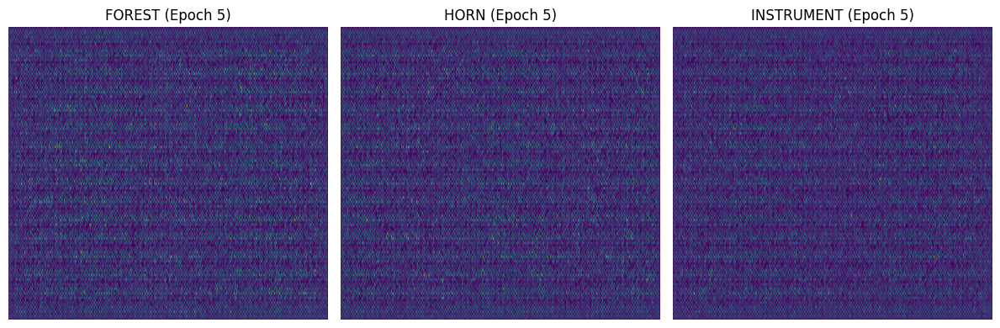

--- End of Epoch 5 ---



Epoch 6/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 6 ---


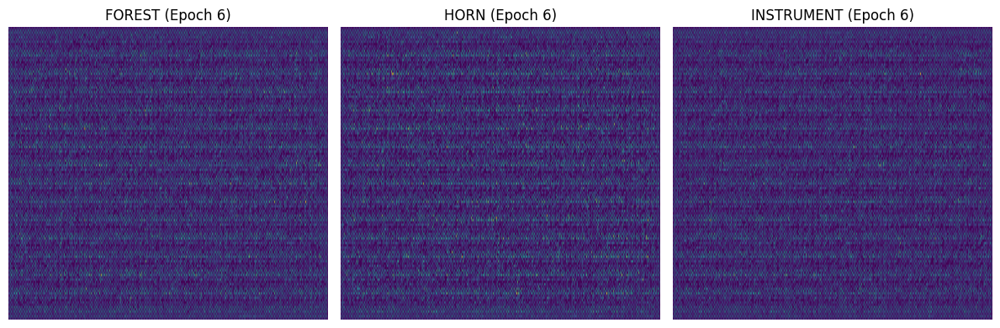

--- End of Epoch 6 ---



Epoch 7/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/


--- Generating Spectrograms for Epoch 7 ---


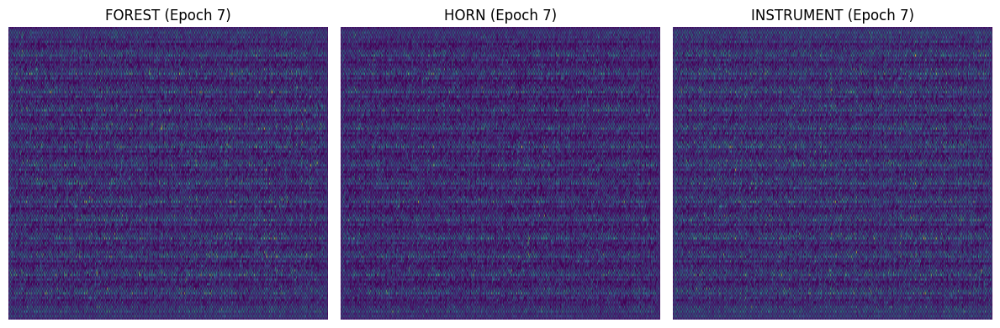

--- End of Epoch 7 ---



Epoch 8/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 8 ---


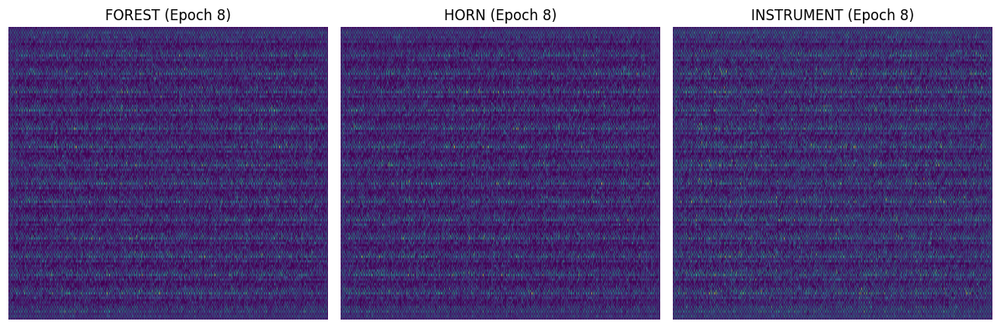

--- End of Epoch 8 ---



Epoch 9/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/aud


--- Generating Spectrograms for Epoch 9 ---


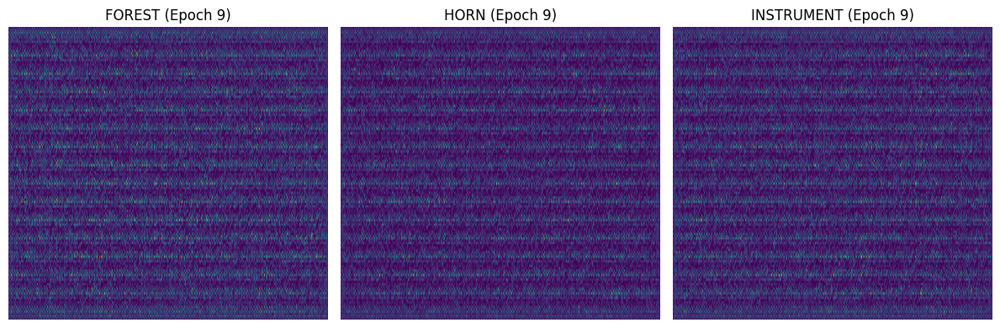

--- End of Epoch 9 ---



Epoch 10/10:   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/au


--- Generating Spectrograms for Epoch 10 ---


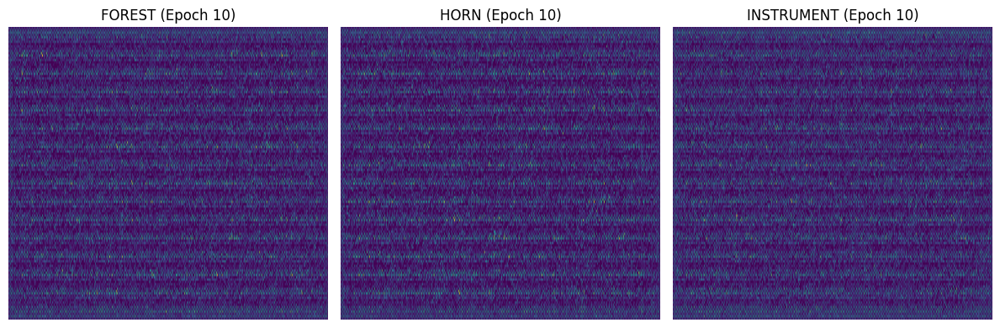

--- End of Epoch 10 ---



In [33]:
# --- Configuration ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LATENT_DIM = 100      # Latent vector size for generator
EPOCHS = 10           # Start small for testing
BATCH = 8             # Batch size
LR = 2e-4             # Learning rate

train_path = '/content/drive/MyDrive/Audios'
cats = sorted([d for d in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, d))])
print("Categories:", cats)

ds = TrainAudioSpectrogramDataset(train_path, cats)
dl = DataLoader(ds, batch_size=BATCH, shuffle=True, num_workers=2)

G = CGAN_Generator(LATENT_DIM, len(cats)).to(DEVICE)
D = CGAN_Discriminator(len(cats)).to(DEVICE)

train_gan(G, D, dl, DEVICE, cats, EPOCHS, LR, LATENT_DIM)

